In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn import preprocessing

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69305 entries, 0 to 69304
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              69305 non-null  int64  
 1   name                            69305 non-null  object 
 2   host_id                         69305 non-null  int64  
 3   host_identity_verified          69305 non-null  object 
 4   host_name                       69305 non-null  object 
 5   neighbourhood_group             69305 non-null  object 
 6   neighbourhood                   69305 non-null  object 
 7   lat                             69305 non-null  float64
 8   long                            69305 non-null  float64
 9   instant_bookable                69305 non-null  bool   
 10  cancellation_policy             69305 non-null  object 
 11  room_type                       69305 non-null  object 
 12  construction_year               

C:\Users\BAPS\AppData\Local\Temp\ipykernel_3600\3449779700.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


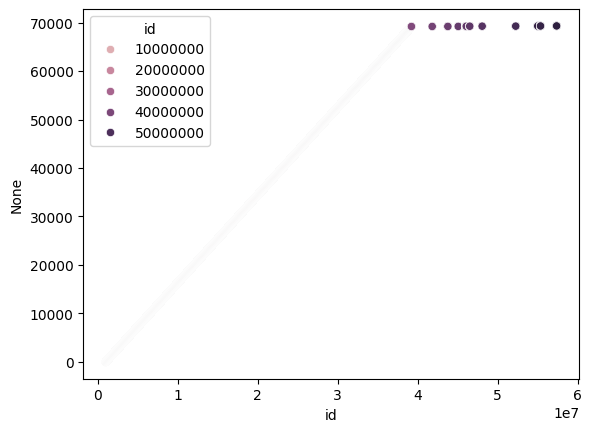

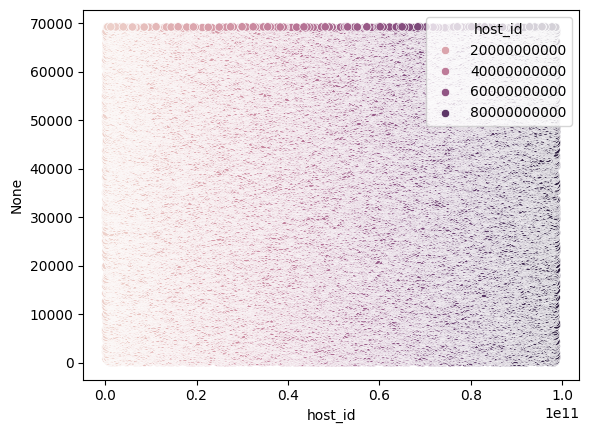

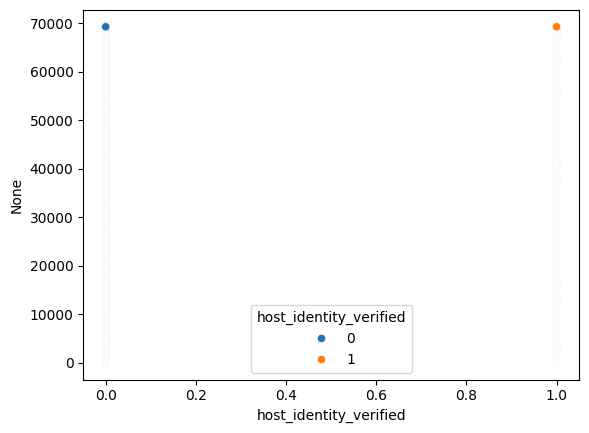

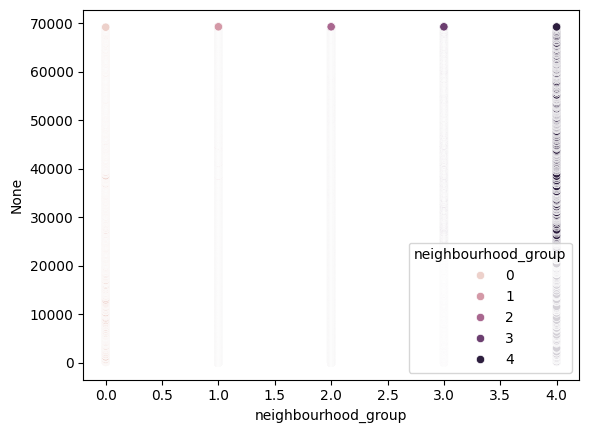

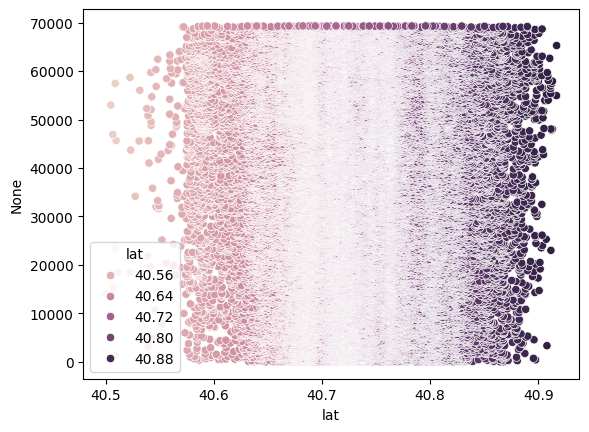

...

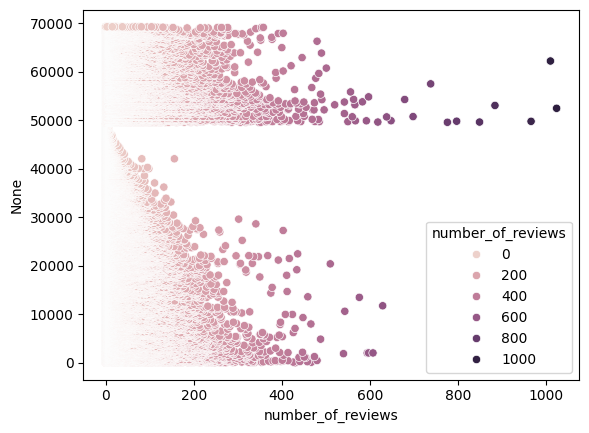

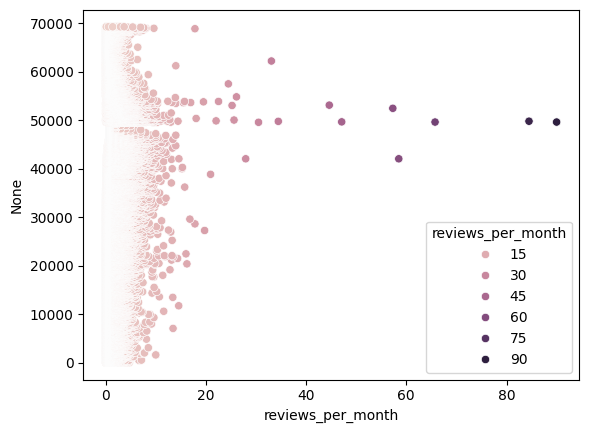

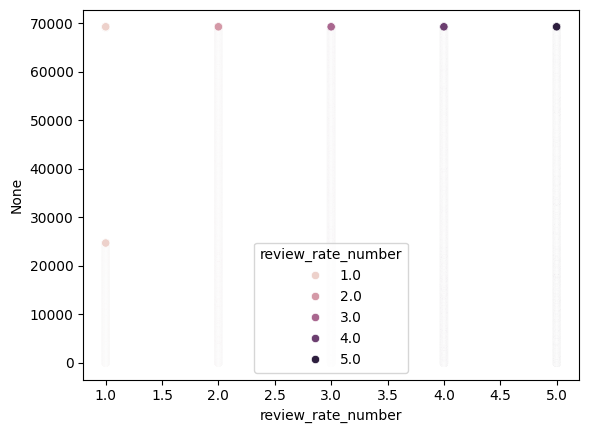

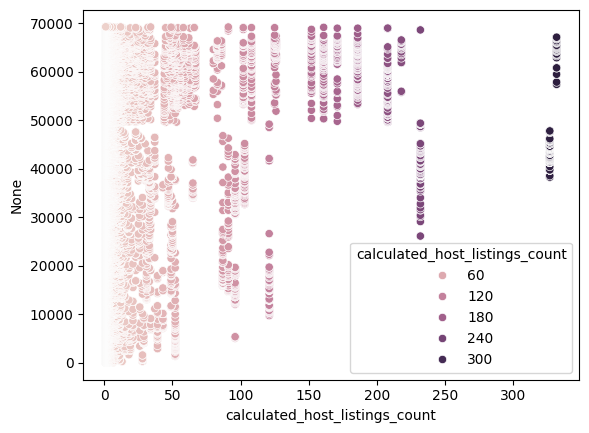

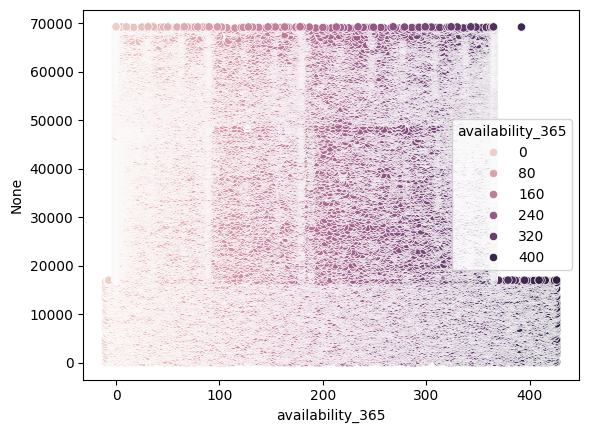

<Figure size 640x480 with 0 Axes>

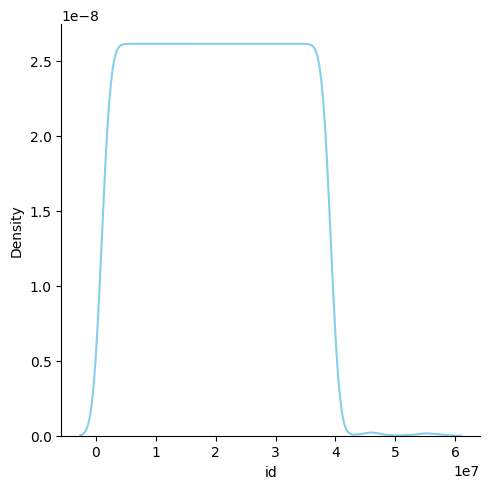

<Figure size 640x480 with 0 Axes>

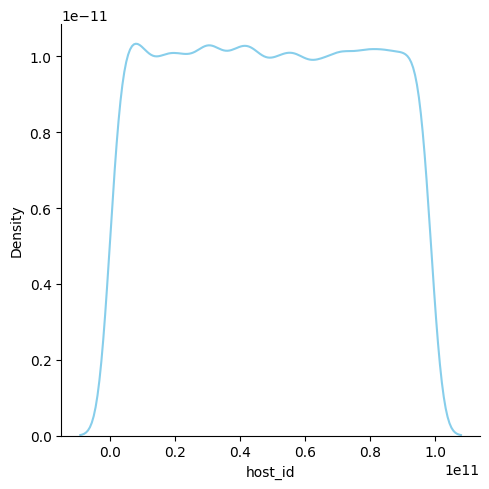

<Figure size 640x480 with 0 Axes>

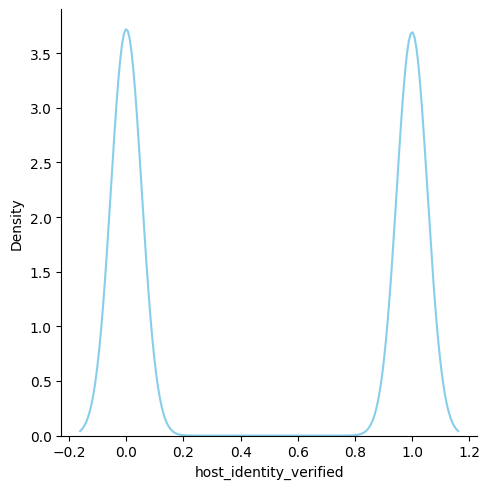

<Figure size 640x480 with 0 Axes>

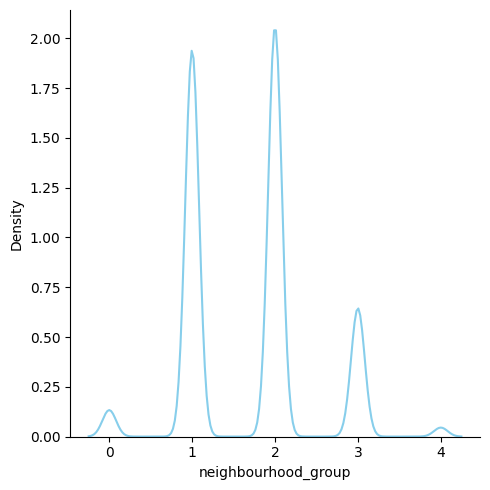

<Figure size 640x480 with 0 Axes>

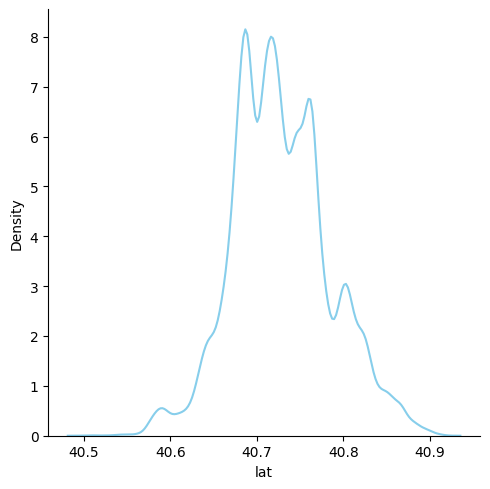

<Figure size 640x480 with 0 Axes>

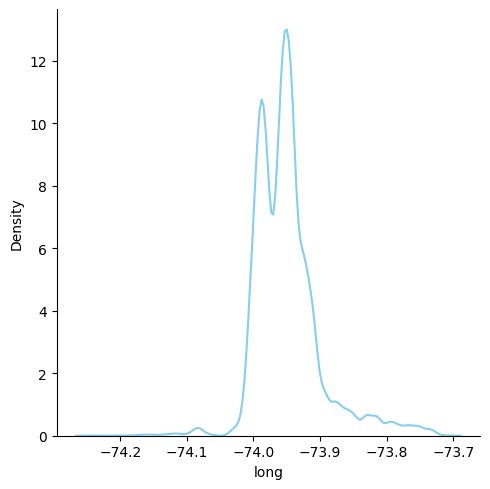

<Figure size 640x480 with 0 Axes>

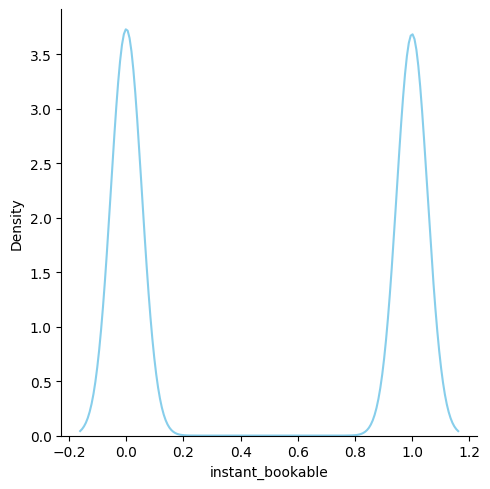

<Figure size 640x480 with 0 Axes>

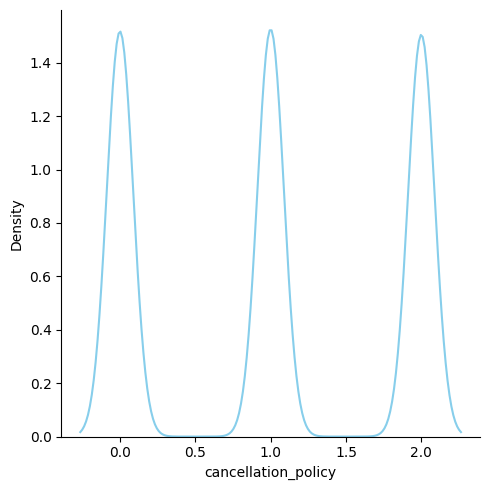

<Figure size 640x480 with 0 Axes>

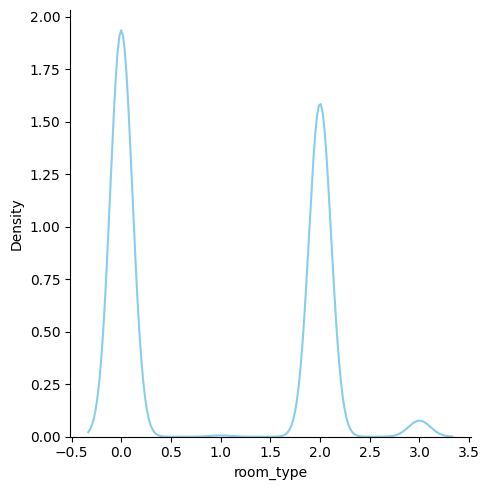

<Figure size 640x480 with 0 Axes>

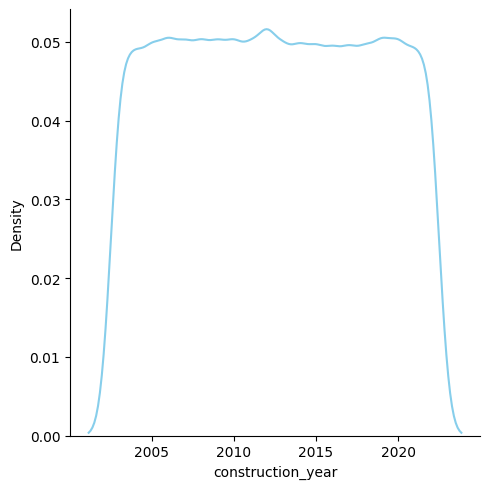

<Figure size 640x480 with 0 Axes>

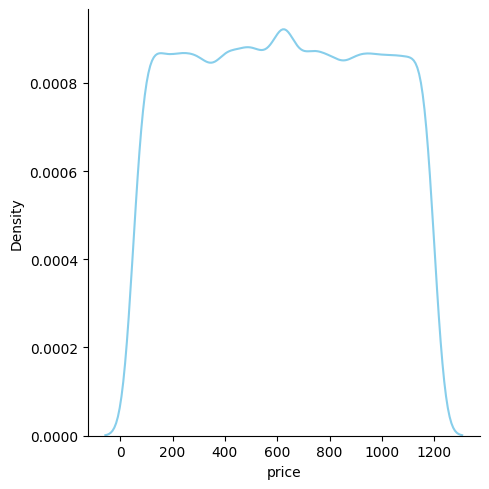

<Figure size 640x480 with 0 Axes>

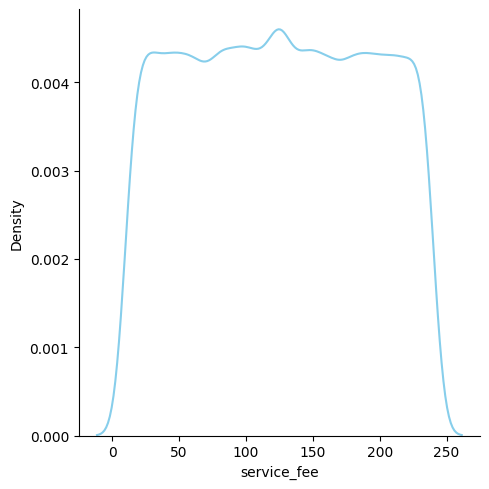

<Figure size 640x480 with 0 Axes>

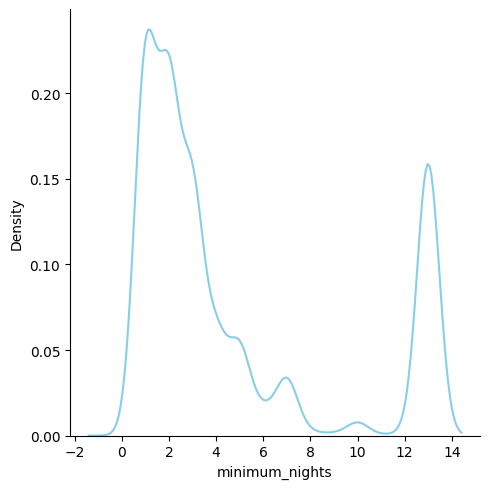

<Figure size 640x480 with 0 Axes>

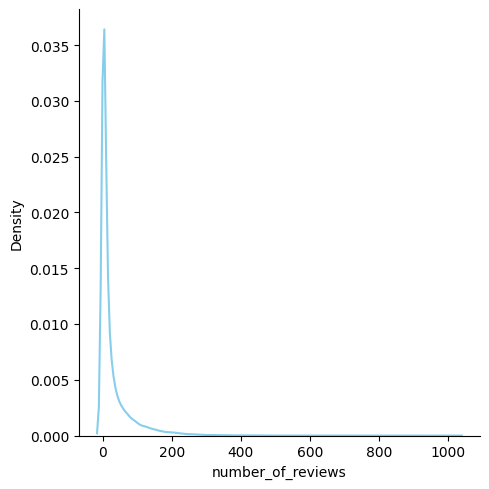

<Figure size 640x480 with 0 Axes>

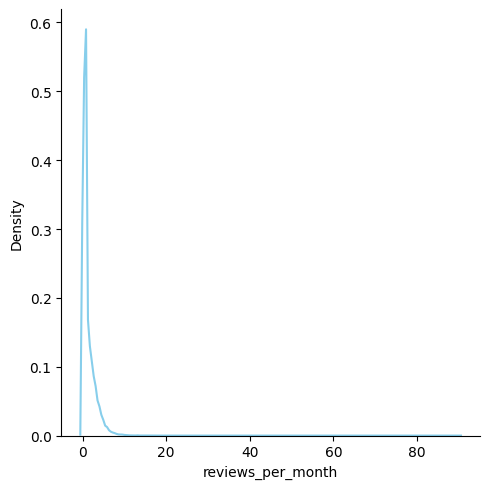

<Figure size 640x480 with 0 Axes>

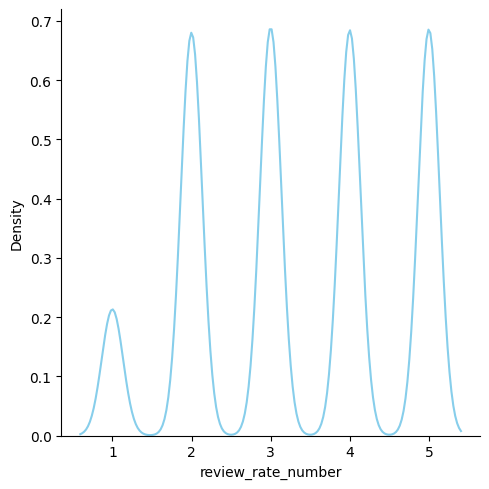

<Figure size 640x480 with 0 Axes>

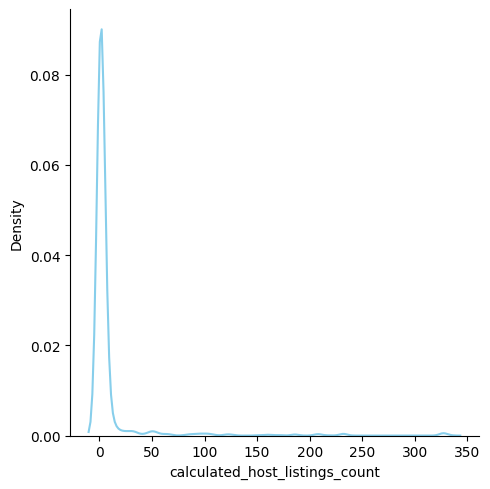

<Figure size 640x480 with 0 Axes>

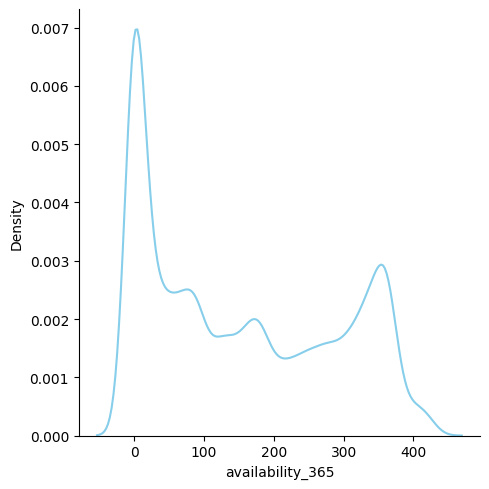

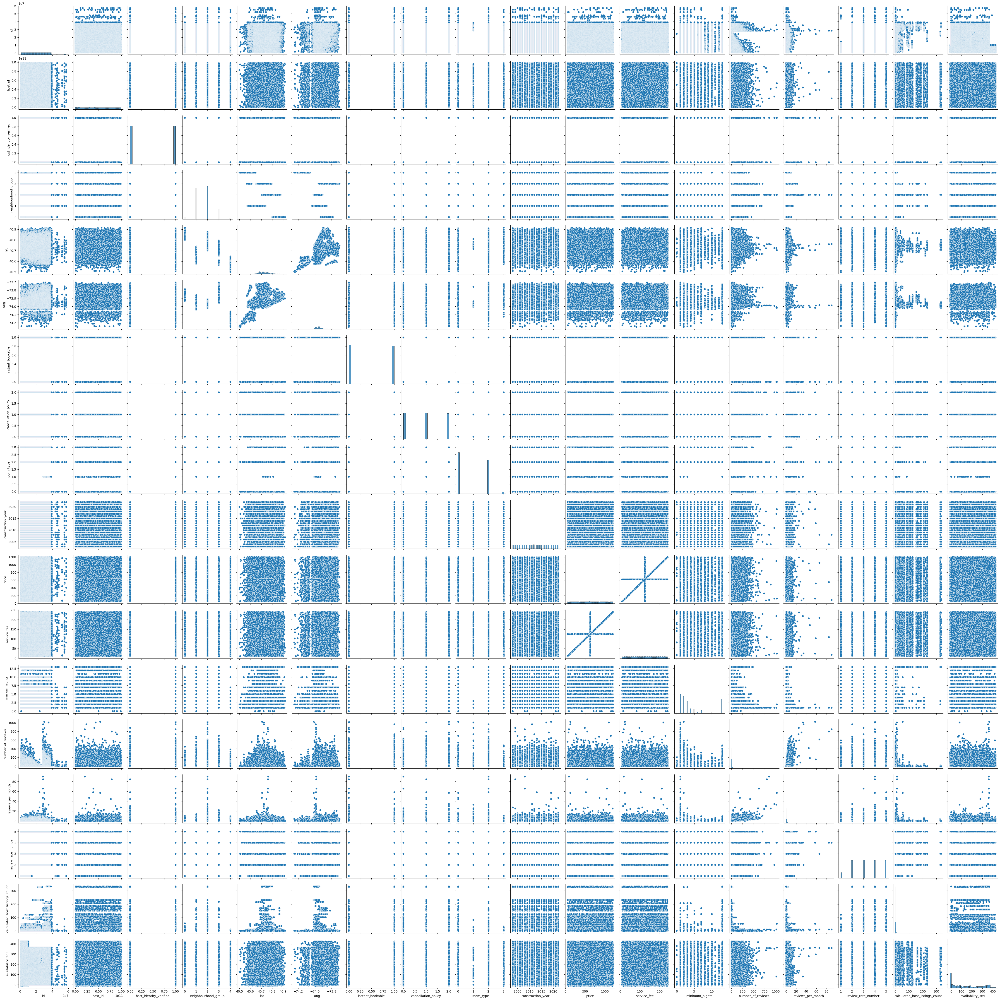

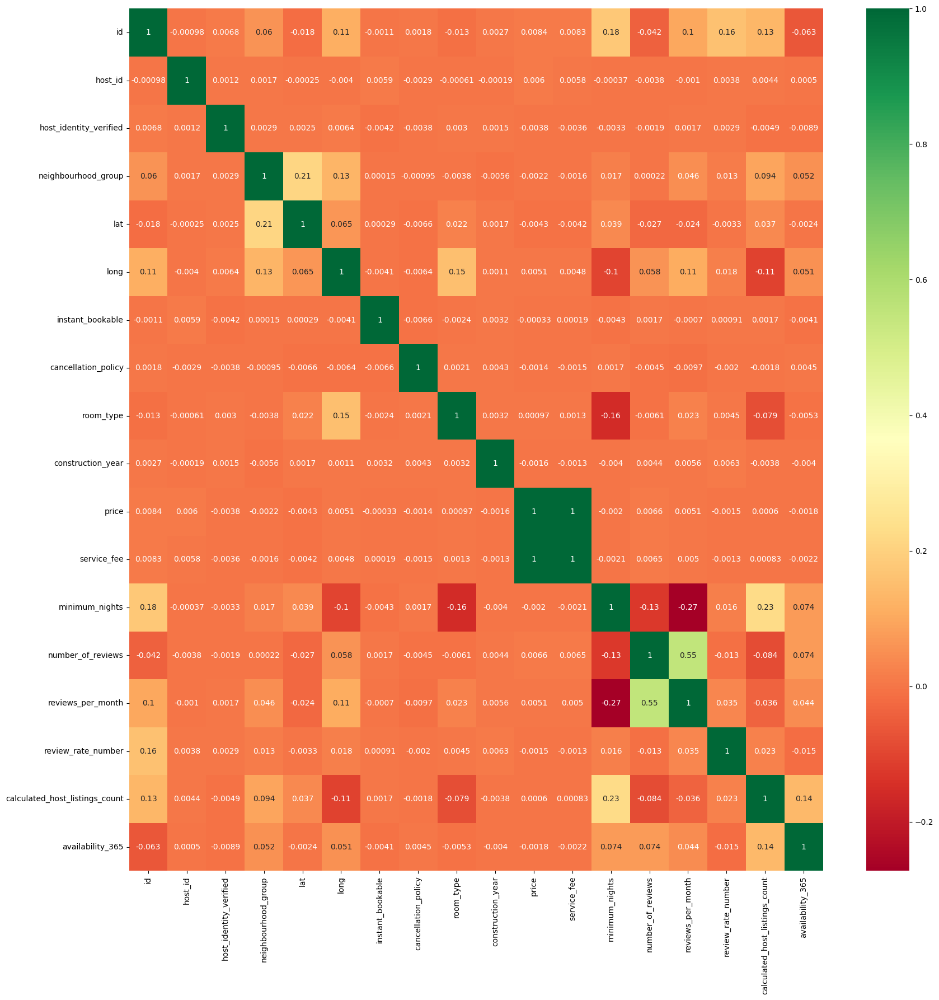

Before outlier removal :  (69305, 16)
After Z-Score approach :  (60296, 16)


C:\Users\BAPS\AppData\Local\Temp\ipykernel_3600\3449779700.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


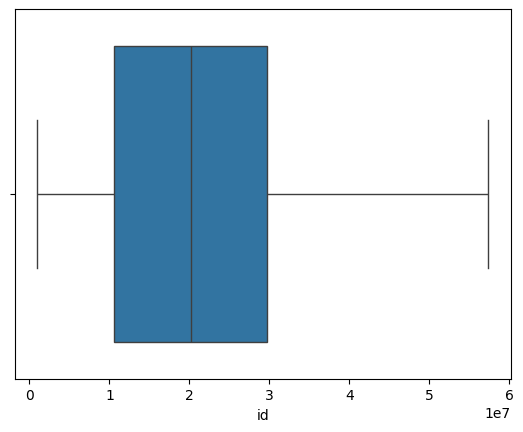

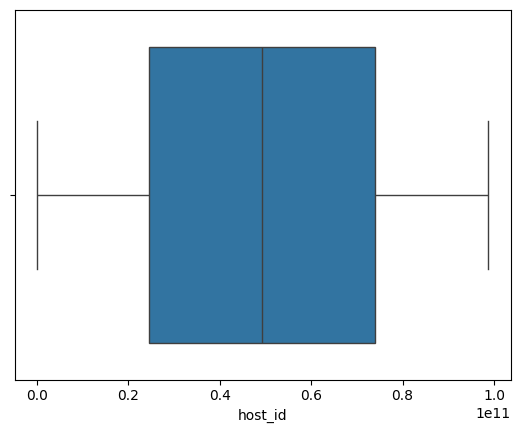

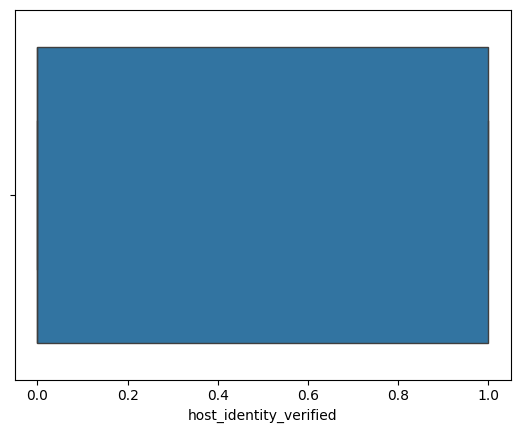

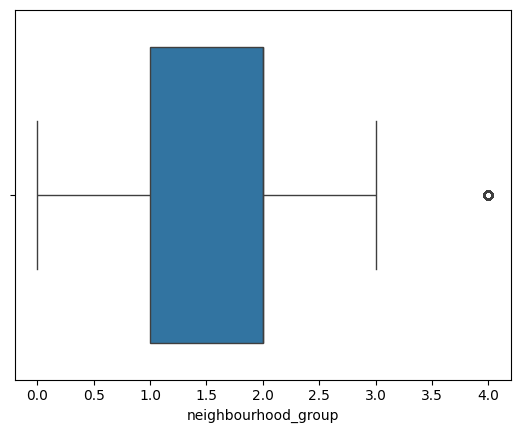

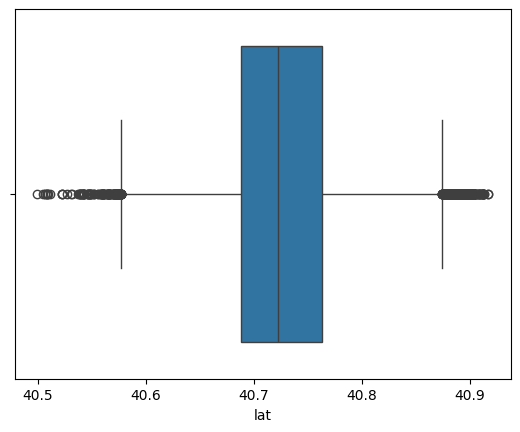

...

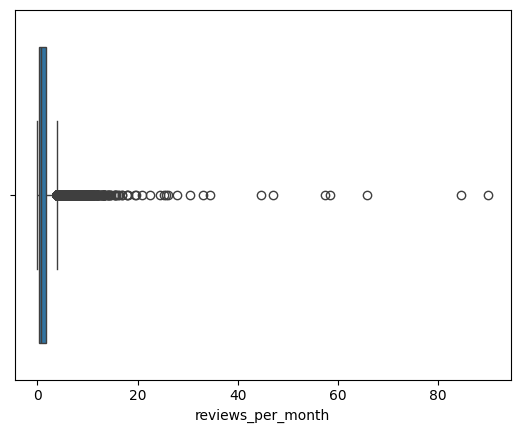

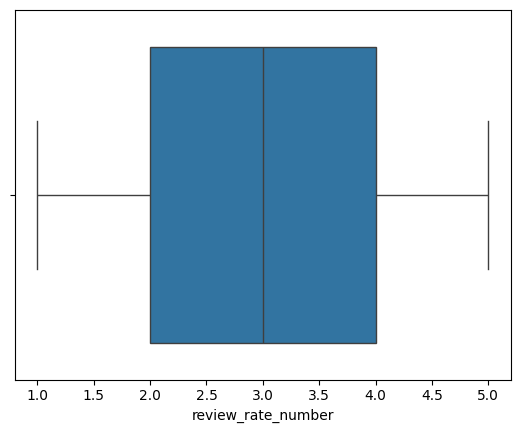

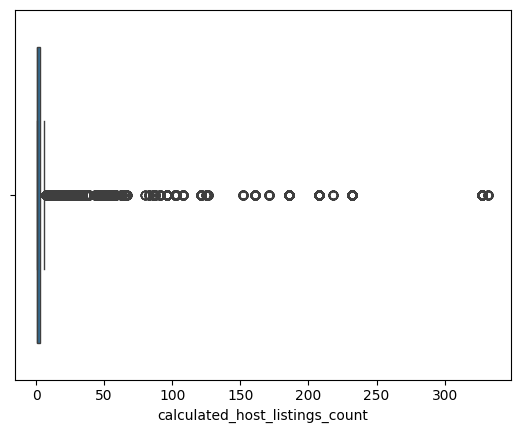

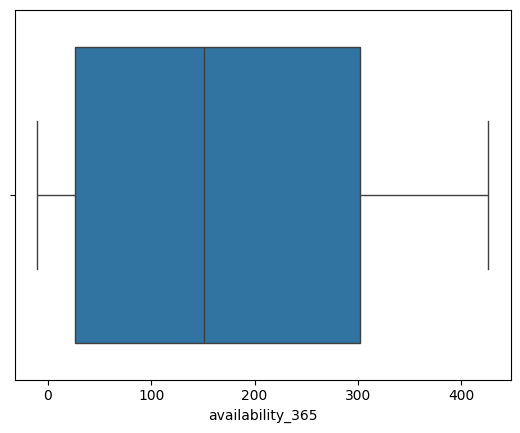

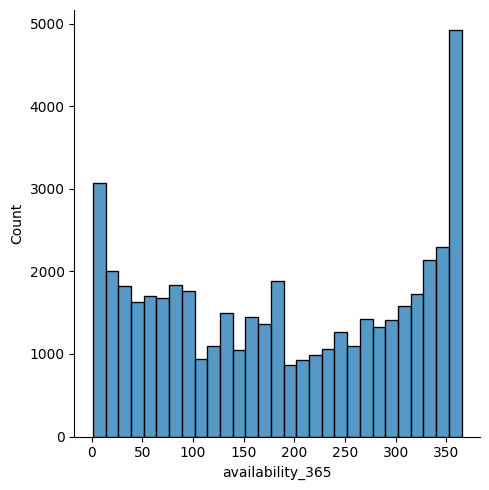

(35881, 15)
(11961, 15)
(35881,)
(11961,)


In [3]:
df=pd.read_csv(r"C:\Users\BAPS\Desktop\Python\Datasets\airbnb_nyc_clean.csv")
df.head()
df_o=df
df['service_fee'].unique().shape
df["neighbourhood_group"].unique()
lst=['Brooklyn', 'Manhattan']
for i in lst:
    c1=df['neighbourhood_group'] ==i
df2=df.where(c1,inplace=False)
df2.dropna()
df.info()
# OBSERVATION -> Columns ['name', 'host_identity_verified', 'host_name', 'neighbourhood_group','neighbourhood',
#  'cancellation_policy', 'room_type', 'last_review','house_rules'] are object datatypes columns 
#   rest all columns are numeric 
#   There is no null values present in the dataset
a=df.select_dtypes(include="object")
a
df.shape    #There are 69305 records and 23 features
df=df.drop(["name","host_name","last_review","house_rules","neighbourhood"],axis=1)
df
df.describe().T
# Label Encoder
encoder=LabelEncoder()
df['room_type']=encoder.fit_transform(df["room_type"])
df['host_identity_verified']=encoder.fit_transform(df['host_identity_verified'])
df['neighbourhood_group']=encoder.fit_transform(df['neighbourhood_group'])
df['instant_bookable']=encoder.fit_transform(df["instant_bookable"])
df['cancellation_policy']=encoder.fit_transform(df['cancellation_policy'])
df.info()
df1=df
# Univariant Analysis
for col in df.columns:
    plt.figure()
    sns.scatterplot(x=df[col],data=df,y=df.index,hue=col)
for col in df.columns:
    plt.figure()
    sns.displot(df[col],color='skyblue',kind='kde')
sns.pairplot(data=df1)
corr=df.corr()
plt.subplots(figsize=(20,20))
sns.heatmap(corr,cmap='RdYlGn',annot=True)
plt.show()
skew=df.skew()
skew
for column in df1.columns :
    plt.figure()
    sns.boxplot(x = df1[column], data = df1)
df=df.drop(["id","host_id"],axis=1)
print('Before outlier removal : ',df.shape)
z = np.abs(zscore(df, axis = 1))
threshold = 3.83
dataset = df[(z < threshold).all(axis=1)]
print('After Z-Score approach : ',dataset.shape)
dataset.skew()
dataset.kurt()
from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# scaled_data = scaler.fit_transform(dataset)
# scaled_df = pd.DataFrame(scaled_data,columns=dataset.columns)
# scaled_df.head()
for column in dataset.columns :
    plt.figure()
    sns.boxplot(x = dataset[column], data = dataset)
dataset1=dataset

dataset1['availability_365'].mode()
check1=dataset["availability_365"]>0
check2=dataset["availability_365"]<366
dataset1=dataset.where(check1,inplace=False)
dataset1=dataset1.where(check2,inplace=False)
dataset1=dataset1.dropna()
dataset1
sns.displot(x = dataset1[column], data = dataset1)
dataset1.skew()
dataset1.kurt()
df.kurt()

plt.show()
scaler = preprocessing.RobustScaler()
robust_df = scaler.fit_transform(dataset1)
robust_df = pd.DataFrame(robust_df, columns =dataset1.columns)
scaled_df=robust_df
scaled_df
scaled_df.skew()
scaled_df.kurt()
scaled_df['reviews_per_month']
# scaled_df['reviews_per_month']=np.log(scaled_df['reviews_per_month'])
x = scaled_df.drop(['price'], axis=1)
y = scaled_df['price']

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=0.75)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)
from sklearn.metrics import r2_score 

In [4]:
scaler = preprocessing.RobustScaler()
robust_df = scaler.fit_transform(dataset1)

robust_df = pd.DataFrame(robust_df, columns =dataset1.columns)
scaled_df=robust_df
scaled_df

,host_identity_verified,neighbourhood_group,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
0,0.0,-1.0,-1.007944,-0.336825,0.0,0.5,1.0,0.8,0.548708,0.544554,1.4,0.000000,-0.358025,0.5,2.5,0.456897
1,0.0,0.0,1.148665,0.220647,1.0,-0.5,1.0,-0.7,-0.139165,-0.138614,0.0,-0.264706,0.000000,1.0,0.0,0.741379
2,0.0,-1.0,-0.505274,-0.106115,1.0,0.0,0.0,-0.7,-0.640159,-0.633663,2.0,7.676471,2.376543,0.5,0.0,0.612069
3,1.0,0.0,1.008344,0.182409,0.0,0.0,0.0,-0.3,-0.966203,-0.960396,1.4,0.000000,-0.425926,0.0,0.0,0.469828
4,0.0,-1.0,-0.482043,-0.036592,0.0,0.0,1.0,-0.3,0.735586,0.732673,2.0,1.176471,-0.240741,1.0,0.0,0.168103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47837,1.0,1.0,-1.724766,3.297443,1.0,0.0,1.0,0.8,0.508946,0.504950,-0.4,1.970588,1.265432,-1.0,0.0,0.620690
47838,1.0,0.0,0.002603,-0.883136,0.0,-0.5,0.0,0.8,0.701789,0.702970,-0.2,0.352941,-0.030864,0.5,0.5,0.702586
47839,1.0,-1.0,-0.427704,0.357133,0.0,-0.5,0.0,-0.2,0.236581,0.237624,2.0,-0.147059,-0.388889,-1.0,0.0,-0.008621
47840,1.0,0.0,0.969893,-0.409459,1.0,-0.5,0.0,-0.2,-0.129749,-0.129762,0.0,0.852941,0.376543,0.0,0.0,-0.642241


In [5]:
scaled_df.skew()
scaled_df.kurt()
scaled_df['reviews_per_month']

0       -0.358025
1        0.000000
2        2.376543
3       -0.425926
4       -0.240741
           ...   
47837    1.265432
47838   -0.030864
47839   -0.388889
47840    0.376543
47841    1.790123
Name: reviews_per_month, Length: 47842, dtype: float64

In [6]:
from sklearn.tree import DecisionTreeRegressor

In [7]:
dt_model = DecisionTreeRegressor()
dt_model.fit(x_train, y_train)

,criterion,'squared_error'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,ccp_alpha,0.0


In [8]:
y_predict_dt_train=dt_model.predict(x_train)
y_predict_dt_test=dt_model.predict(x_test)

In [9]:
print(r2_score(y_train, y_predict_dt_train))
print("\n")
print(r2_score(y_test, y_predict_dt_test))  

0.9999417933649576


0.9852290007787639


### Grid Search Cv

In [10]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

# Define model
dt = DecisionTreeRegressor(random_state=42)

# Define hyperparameter grid
param_grid = {
    'max_depth': [3, 5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['sqrt', 'log2', None],
    'criterion': ['squared_error', 'friedman_mse']
}

# GridSearchCV
grid_search = GridSearchCV(
    estimator=dt,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1
)

# Fit model
grid_search.fit(x_train, y_train)

# Best model
best_dt = grid_search.best_estimator_

# Predict
y_predict_train = best_dt.predict(x_train)
y_predict_test = best_dt.predict(x_test)

# Scores
from sklearn.metrics import r2_score
print("Train R2:", r2_score(y_train, y_predict_train))
print("Test R2 :", r2_score(y_test, y_predict_test))
print("Best Parameters:", grid_search.best_params_)

Train R2: 0.9949919163353292
Test R2 : 0.9919615886093344
Best Parameters: {'criterion': 'friedman_mse', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 10, 'min_samples_split': 2}


### RandomSearch CV

In [11]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import r2_score
import numpy as np

# Define model
dt = DecisionTreeRegressor(random_state=42)

# Define hyperparameter distributions
param_dist = {
    'max_depth': [3, 5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': ['sqrt', 'log2', None],
    'criterion': ['squared_error', 'friedman_mse']
}

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=dt,
    param_distributions=param_dist,
    n_iter=30,           # Try 30 random combinations
    cv=5,
    scoring='r2',
    n_jobs=-1,
    random_state=42
)

# Fit model
random_search.fit(x_train, y_train)

# Best model
best_dt_random = random_search.best_estimator_

# Predict
y_predict_train = best_dt_random.predict(x_train)
y_predict_test = best_dt_random.predict(x_test)

# Scores
print("Train R2:", r2_score(y_train, y_predict_train))
print("Test R2 :", r2_score(y_test, y_predict_test))
print("Best Parameters:", random_search.best_params_)


Train R2: 0.9951575016136989
Test R2 : 0.9916874433161496
Best Parameters: {'min_samples_split': 2, 'min_samples_leaf': 10, 'max_features': None, 'max_depth': 20, 'criterion': 'friedman_mse'}
